In [13]:
#pip install gpt_2_simple

# RNN - slow to train as it is sequential

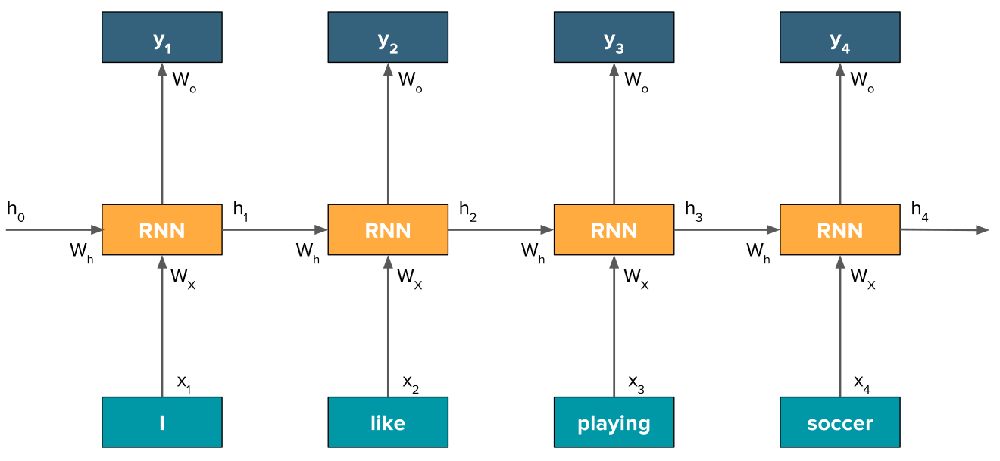

Attention is a mechanism that allows GPT to focus on relevant parts of the input when generating text. Instead of treating all words equally, it assigns weights to each token based on its relevance to others in the sequence. This enables GPT to capture contextual relationships and long-range dependencies effectively

### Transformers - word order is part of the data not the process like RNNs. So can be trainned in parrallel.
### Can understand words by the words around it

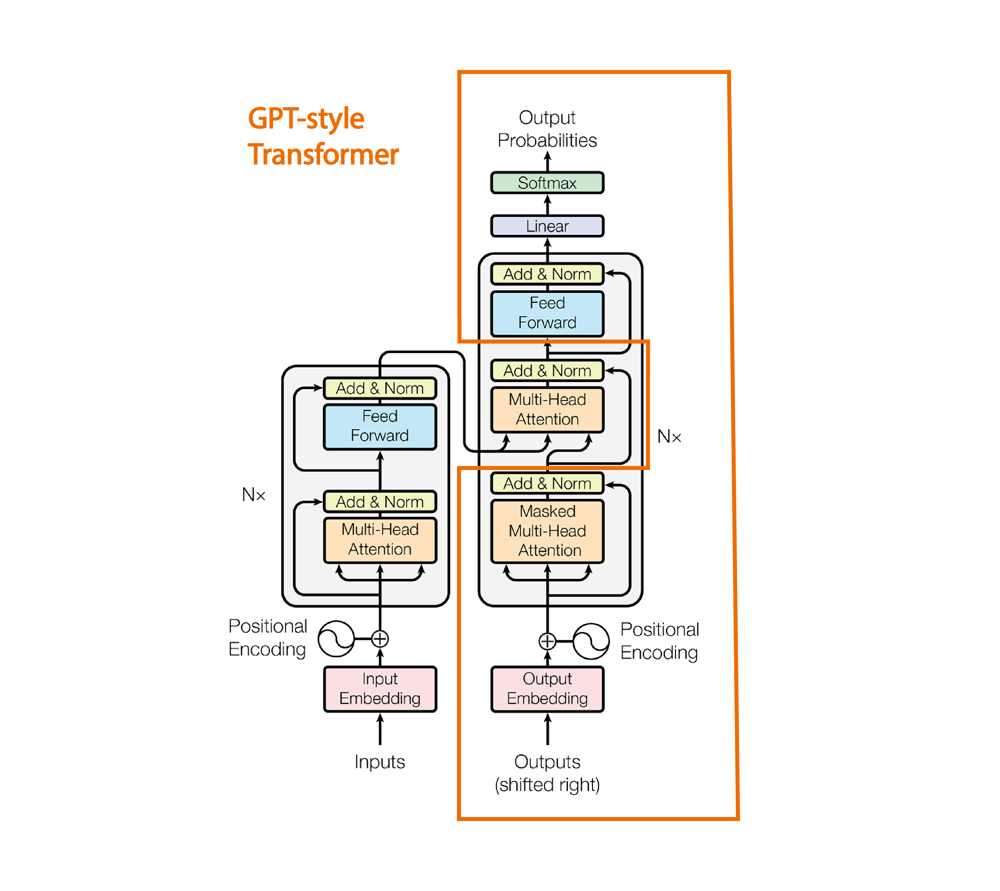

# Temprature

Olivia Rodrigo, because her songwriting and vocal performances continue to evolve


<Figure size 1000x600 with 0 Axes>

C:\Users\rolester\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 22905 (\N{CJK UNIFIED IDEOGRAPH-5979}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


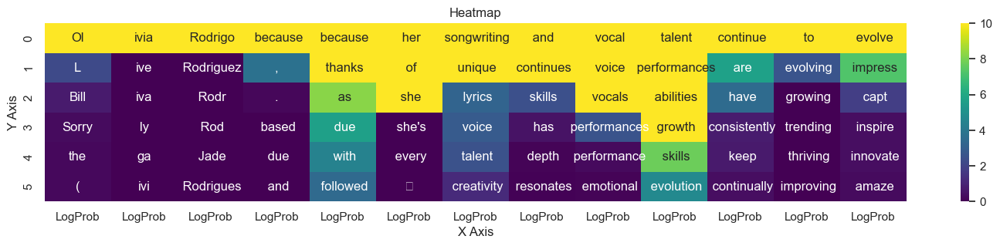

,Token,LogProb,Token,LogProb,Token,LogProb,Token,LogProb,Token,LogProb,...,Token,LogProb,Token,LogProb,Token,LogProb,Token,LogProb,Token,LogProb
0,Ol,94.74,ivia,100.0,Rodrigo,100.0,because,96.05,because,32.52,...,vocal,65.62,talent,21.08,continue,88.80,to,97.30,evolve,88.34
1,L,2.23,ive,0.0,Rodriguez,0.0,",",3.72,thanks,28.70,...,voice,16.59,performances,21.08,are,5.68,evolving,2.59,impress,7.25
2,Bill,0.72,iva,0.0,Rodr,0.0,.,0.19,as,8.22,...,vocals,14.64,abilities,14.49,have,3.44,growing,0.03,capt,1.83
3,Sorry,0.30,ly,0.0,Rod,0.0,based,0.02,due,5.65,...,performances,2.54,growth,11.28,consistently,0.77,trending,0.01,inspire,0.36
4,the,0.23,ga,0.0,Jade,0.0,due,0.01,with,4.40,...,performance,0.27,skills,7.75,keep,0.68,thriving,0.01,innovate,0.36
5,(,0.21,ivi,0.0,Rodrigues,0.0,and,0.00,followed,3.43,...,emotional,0.10,evolution,4.70,continually,0.36,improving,0.01,amaze,0.28


In [5]:
from openai import AzureOpenAI
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)

client = AzureOpenAI(
  azure_endpoint = "https://aifsweden.openai.azure.com/", 
  azure_ad_token_provider=token_provider,
  api_version="2025-03-01-preview"
)

response = client.chat.completions.create(
    model="gpt-4.1-mini",
    temperature=1,
    top_p=1, #how many possible words to consider
    logprobs=True,
    top_logprobs=6,
    messages=[
        {"role": "user", "content": "What are the next words after this (just the words) max out at 10 words. I think the best female music artist of 2026 is "}
    ],
)

print(response.choices[0].message.content)

import pandas as pd
import numpy
dfr = pd.DataFrame()
i = 0

for each in response.choices[0].logprobs.content:
    d = pd.DataFrame(each.top_logprobs)[[0,2]]
    d["id"] = i
    dfr = pd.concat([dfr, d])
    i=i+1

dfr.columns = ["Token", "LogProb", "id"]
dfr["Token"] = dfr["Token"].str[1].astype(str)
dfr["LogProb"] = round(numpy.exp(dfr["LogProb"].str[1].astype(float))*100,2)

dfr2 = pd.DataFrame()
for i in dfr["id"].unique():
    dfr2 = pd.concat([dfr2, dfr[dfr["id"]==i][["Token", "LogProb"]]], axis=1)

dfr2.style.set_table_styles([dict(selector='th', props=[('text-align', 'center')])])

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 6))
sns.set_theme(style="whitegrid")

plt.figure(figsize=(18,3))
sns.heatmap(dfr2["LogProb"], annot=dfr2["Token"].values.tolist(), cmap='viridis', vmin=0, vmax=10, fmt = '')
plt.title('Heatmap')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.show()

dfr2

swer: divert the tram to the other track, saving five.


<Figure size 1000x600 with 0 Axes>

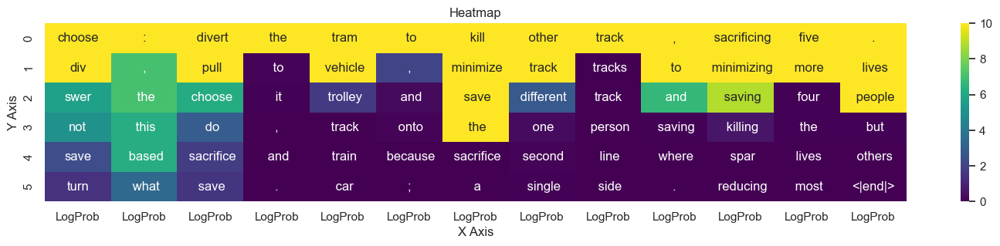

,Token,LogProb,Token,LogProb,Token,LogProb,Token,LogProb,Token,LogProb,...,Token,LogProb,Token,LogProb,Token,LogProb,Token,LogProb,Token,LogProb
0,choose,61.02,:,66.89,divert,65.90,the,99.84,tram,71.87,...,track,100.0,",",63.32,sacrificing,50.89,five,62.16,.,70.34
1,div,22.45,",",7.05,pull,16.66,to,0.10,vehicle,26.44,...,tracks,0.0,to,29.91,minimizing,39.64,more,37.70,lives,15.69
2,swer,5.68,the,7.05,choose,6.13,it,0.05,trolley,1.69,...,track,0.0,and,6.67,saving,8.84,four,0.07,people,13.85
3,not,5.01,this,6.22,do,2.90,",",0.00,track,0.00,...,person,0.0,saving,0.04,killing,0.57,the,0.04,but,0.04
4,save,2.37,based,6.22,sacrifice,1.76,and,0.00,train,0.00,...,line,0.0,where,0.02,spar,0.02,lives,0.01,others,0.02
5,turn,1.44,what,3.33,save,1.55,.,0.00,car,0.00,...,side,0.0,.,0.01,reducing,0.01,most,0.00,<|end|>,0.02


In [2]:
from openai import AzureOpenAI
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)

client = AzureOpenAI(
  azure_endpoint = "https://aifsweden.openai.azure.com/", 
  azure_ad_token_provider=token_provider,
  api_version="2025-03-01-preview"
)

response = client.chat.completions.create(
    model="gpt-4.1-mini",
    temperature=1,
    top_p=1, #how many possible words to consider
    logprobs=True,
    top_logprobs=6,
    messages=[
        {"role": "user", "content": "What are the next words after this (just the words) max out at 10 words. A runaway tram is on course to collide with and kill a five people tied to the tracks, you may divert the vehicle to kill just one person on a different track. You should "}
    ],
)

print(response.choices[0].message.content)

import pandas as pd
import numpy
dfr = pd.DataFrame()
i = 0

for each in response.choices[0].logprobs.content:
    d = pd.DataFrame(each.top_logprobs)[[0,2]]
    d["id"] = i
    dfr = pd.concat([dfr, d])
    i=i+1

dfr.columns = ["Token", "LogProb", "id"]
dfr["Token"] = dfr["Token"].str[1].astype(str)
dfr["LogProb"] = round(numpy.exp(dfr["LogProb"].str[1].astype(float))*100,2)

dfr2 = pd.DataFrame()
for i in dfr["id"].unique():
    dfr2 = pd.concat([dfr2, dfr[dfr["id"]==i][["Token", "LogProb"]]], axis=1)

dfr2.style.set_table_styles([dict(selector='th', props=[('text-align', 'center')])])

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 6))
sns.set_theme(style="whitegrid")

plt.figure(figsize=(18,3))
sns.heatmap(dfr2["LogProb"], annot=dfr2["Token"].values.tolist(), cmap='viridis', vmin=0, vmax=10, fmt = '')
plt.title('Heatmap')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.show()

dfr2

# Internals

In [1]:
import gpt_2_simple as gpt2
import tensorflow as tf
#tf.reset_default_graph()
tf.compat.v1.reset_default_graph()
sess = gpt2.start_tf_sess()

In [2]:
from bertviz.transformers_neuron_view import GPT2Model, GPT2Tokenizer
from bertviz.neuron_view import show

print("Everything focused on the first word is a null position where it has found no attention")

model_type = 'gpt2'
model_version = 'gpt2'
model = GPT2Model.from_pretrained(model_version)
tokenizer = GPT2Tokenizer.from_pretrained(model_version)
#text = "Willow was using her crystalball to see Tara's future, it was dark"
text = "The cat was sat on the mat because it was muddy"

show(model, model_type, tokenizer, text, display_mode='dark')

Everything focused on the first word is a null position where it has found no attention


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Different heads specialise

some heads manage form

some heads manage structure

some heads manage reference

some heads manage meaning


In [3]:
from bertviz import head_view, model_view
from transformers import BertTokenizer, BertModel

model_version = 'bert-base-uncased'
model = BertModel.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version)
sentence_a = "The cat was sat on the mat because it was muddy"
#sentence_b = "The cat lay on the rug"
inputs = tokenizer.encode_plus(sentence_a, return_tensors='pt')
input_ids = inputs['input_ids']
token_type_ids = inputs['token_type_ids']
attention = model(input_ids, token_type_ids=token_type_ids)[-1]
#sentence_b_start = token_type_ids[0].tolist().index(1)
input_id_list = input_ids[0].tolist() # Batch index 0
tokens = tokenizer.convert_ids_to_tokens(input_id_list) 

In [4]:
head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [5]:
from bertviz.transformers_neuron_view import GPT2Model, GPT2Tokenizer
from bertviz.neuron_view import show

model_type = 'gpt2'
model_version = 'gpt2'
model = GPT2Model.from_pretrained(model_version)
tokenizer = GPT2Tokenizer.from_pretrained(model_version)
#text = "Willow was using her crystalball to see Tara's future, it was dark"
text = "The quick brown fox jumps over the lazy dog"
#text = "The cat was sat on the mat because it was muddy"

show(model, model_type, tokenizer, text, display_mode='dark')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [6]:
from bertviz import model_view
from transformers import GPT2Tokenizer, GPT2Model
print("What does 'it' refer to?")
model_version = 'gpt2'
model = GPT2Model.from_pretrained(model_version, output_attentions=True)
tokenizer = GPT2Tokenizer.from_pretrained(model_version)
#text = "Willow was using her crystalball to see Tara's future, it was dark"
#text = "The quick brown fox jumps over the lazy dog"
text = "The cat was sat on the mat because it was muddy"
inputs = tokenizer.encode_plus(text, return_tensors='pt', add_special_tokens=True)
input_ids = inputs['input_ids']
attention = model(input_ids)[-1]
input_id_list = input_ids[0].tolist() # Batch index 0
tokens = tokenizer.convert_ids_to_tokens(input_id_list)
model_view(attention, tokens)


What does 'it' refer to?


<IPython.core.display.Javascript object>

https://poloclub.github.io/transformer-explainer/


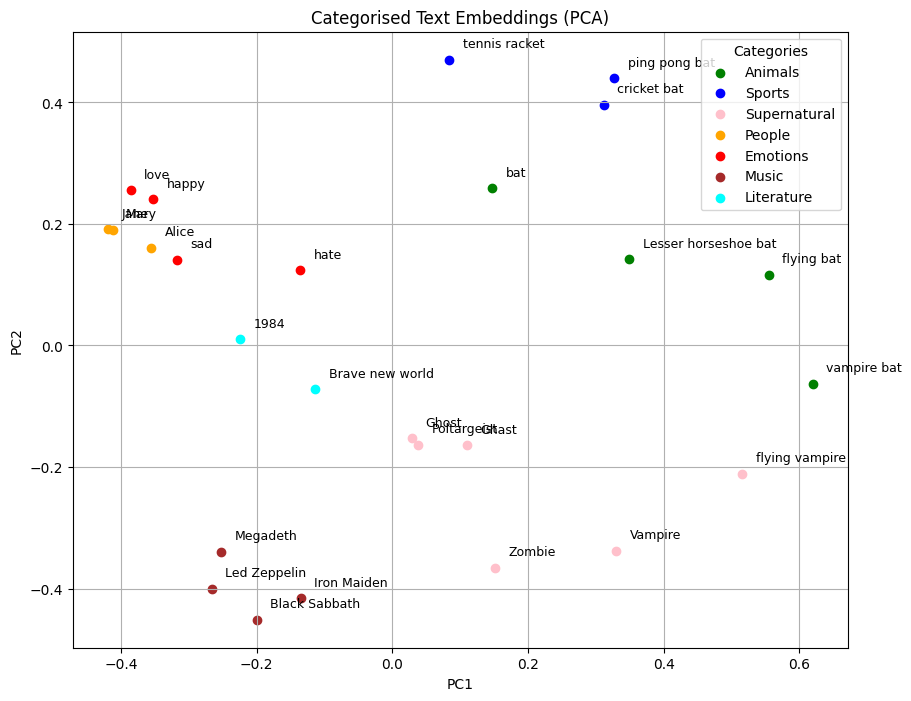

In [4]:
import os
from openai import AzureOpenAI
from azure.identity import DefaultAzureCredential, get_bearer_token_provider
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Authentication
token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)

endpoint = "https://aifsweden.cognitiveservices.azure.com/"
deployment = "text-embedding-3-small"

client = AzureOpenAI(
    api_version="2024-12-01-preview",
    azure_endpoint=endpoint,
    azure_ad_token_provider=token_provider,
)

# Input text
inp = [
    "bat","vampire bat","flying bat","cricket bat","Lesser horseshoe bat",
    "tennis racket","ping pong bat","flying vampire","Ghost","Zombie","Vampire",
    "Jane","Alice","Mary","love","hate","happy","sad",
    "Led Zeppelin","Iron Maiden","Megadeth","Black Sabbath",
    "1984","Brave new world","Ghast","Poltargeist"
]

# Define categories
categories = {
    "Animals": ["bat","vampire bat","flying bat","Lesser horseshoe bat"],
    "Sports": ["cricket bat","tennis racket","ping pong bat"],
    "Supernatural": ["Ghost","Zombie","Vampire","flying vampire","Ghast","Poltargeist"],
    "People": ["Jane","Alice","Mary"],
    "Emotions": ["love","hate","happy","sad"],
    "Music": ["Led Zeppelin","Iron Maiden","Megadeth","Black Sabbath"],
    "Literature": ["1984","Brave new world"]
}

# Assign colours
colour_map = {
    "Animals": "green",
    "Sports": "blue",
    "Supernatural": "pink",
    "People": "orange",
    "Emotions": "red",
    "Music": "brown",
    "Literature": "cyan"
}

# Generate embeddings
response = client.embeddings.create(input=inp, model=deployment)
matrix = [item.embedding for item in response.data]

# Reduce dimensions to 2D using PCA
pca = PCA(n_components=2)
reduced = pca.fit_transform(matrix)

# Plot with colours
plt.figure(figsize=(10, 8))
for i, label in enumerate(inp):
    x, y = reduced[i]
    # Find category for label
    cat = next((c for c, items in categories.items() if label in items), "Other")
    plt.scatter(x, y, color=colour_map.get(cat, "grey"), label=cat if cat not in plt.gca().get_legend_handles_labels()[1] else "")
    plt.text(x + 0.02, y + 0.02, label, fontsize=9)

plt.title("Categorised Text Embeddings (PCA)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.legend(title="Categories")
plt.show()


In [6]:
import os
from openai import AzureOpenAI
from azure.identity import DefaultAzureCredential, get_bearer_token_provider
import umap
import pandas as pd
import plotly.express as px

# ======================
# Authentication
# ======================
token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)

endpoint = "https://aifsweden.cognitiveservices.azure.com/"
deployment = "text-embedding-3-small"

client = AzureOpenAI(
    api_version="2024-12-01-preview",
    azure_endpoint=endpoint,
    azure_ad_token_provider=token_provider,
)

# ======================
# Input text
# ======================
inp = [
    "bat","vampire bat","flying bat","cricket bat","Lesser horseshoe bat",
    "tennis racket","ping pong bat","flying vampire","Ghost","Zombie","Vampire",
    "Jane","Alice","Mary","love","hate","happy","sad",
    "Led Zeppelin","Iron Maiden","Megadeth","Black Sabbath",
    "1984","Brave new world","Ghast","Poltargeist"
]

# ======================
# Categories
# ======================
categories = {
    "Animals": ["bat","vampire bat","flying bat","Lesser horseshoe bat"],
    "Sports": ["cricket bat","tennis racket","ping pong bat"],
    "Supernatural": ["Ghost","Zombie","Vampire","flying vampire","Ghast","Poltargeist"],
    "People": ["Jane","Alice","Mary"],
    "Emotions": ["love","hate","happy","sad"],
    "Music": ["Led Zeppelin","Iron Maiden","Megadeth","Black Sabbath"],
    "Literature": ["1984","Brave new world"]
}

colour_map = {
    "Animals": "green",
    "Sports": "blue",
    "Supernatural": "pink",
    "People": "orange",
    "Emotions": "red",
    "Music": "brown",
    "Literature": "cyan"
}

# ======================
# Generate embeddings
# ======================
response = client.embeddings.create(input=inp, model=deployment)
matrix = [item.embedding for item in response.data]

# ======================
# UMAP (3D)
# ======================
reducer = umap.UMAP(
    n_components=3,
    n_neighbors=5,   # better for small dataset
    min_dist=0.1,
    random_state=42
)

reduced = reducer.fit_transform(matrix)

# ======================
# Build dataframe
# ======================
df = pd.DataFrame(reduced, columns=["x", "y", "z"])
df["label"] = inp

# Assign category
def get_category(label):
    for cat, items in categories.items():
        if label in items:
            return cat
    return "Other"

df["category"] = df["label"].apply(get_category)

# ======================
# Plot (interactive 3D)
# ======================
fig = px.scatter_3d(
    df,
    x="x",
    y="y",
    z="z",
    color="category",
    text="label",
    title="Embedding Visualisation (UMAP 3D)",
    color_discrete_map=colour_map
)

# Improve layout
fig.update_traces(textposition='top center')
fig.update_layout(
    height=800,   # ✅ increase vertical size
    width=1200,   # ✅ increase horizontal size (optional)
    legend_title="Categories",
    margin=dict(l=0, r=0, t=40, b=0),  # ✅ maximise usable space
    scene=dict(
        xaxis_title="UMAP 1",
        yaxis_title="UMAP 2",
        zaxis_title="UMAP 3"
    )
)


fig.show()

c:\Python\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


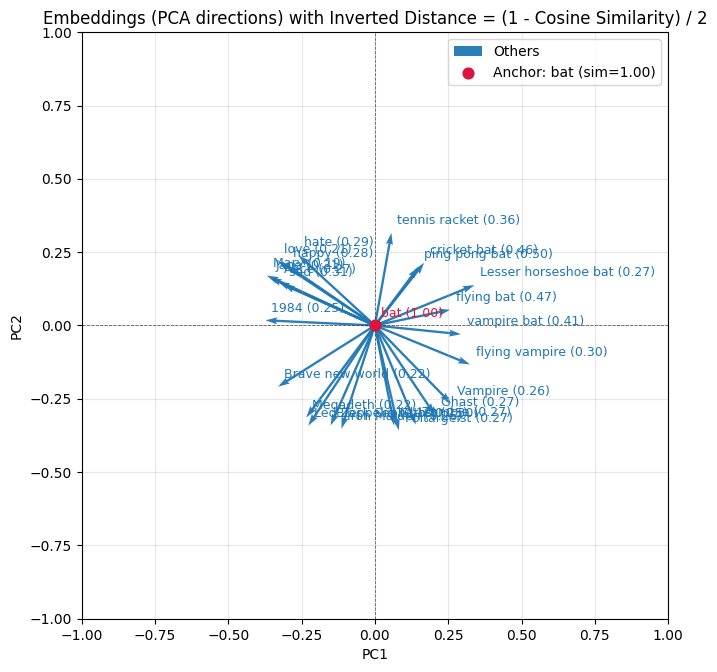

    Index                  Name  Cosine Similarity to Anchor  \
0      18          Led Zeppelin                     0.179558   
1      13                  Mary                     0.187555   
2      14                  love                     0.210516   
3      11                  Jane                     0.213464   
4      20              Megadeth                     0.216535   
5      23       Brave new world                     0.218632   
6      22                  1984                     0.252965   
7      21         Black Sabbath                     0.254020   
8      10               Vampire                     0.256112   
9      19           Iron Maiden                     0.259762   
10     25           Poltargeist                     0.266021   
11      4  Lesser horseshoe bat                     0.266926   
12     24                 Ghast                     0.267012   
13      9                Zombie                     0.268232   
14     12                 Alice         

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def plot_cosine_similarity_pca_inverted(response, labels, anchor_idx=0):
    """
    Plot all embeddings in 2D using PCA for direction, with arrow length inversely
    related to cosine similarity to the anchor:
        length = (1 - sim) / 2  in [0, 1]
    So: sim=1 -> 0 (at origin), sim=0 -> 0.5, sim=-1 -> 1 (furthest).
    """
    # --- Collect embeddings and labels ---
    embeddings = np.array([np.array(item.embedding, dtype=float) for item in response.data], dtype=float)
    names = list(labels)
    n = embeddings.shape[0]
    assert len(names) == n, "Length of labels must equal number of embeddings"

    # --- Normalize embeddings (cosine similarity is dot of unit vectors) ---
    eps = 1e-12
    norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
    embeddings_norm = embeddings / np.clip(norms, eps, None)

    # --- Cosine similarities to anchor ---
    anchor_vec = embeddings_norm[anchor_idx]
    sims = embeddings_norm @ anchor_vec  # shape (n,)

    # --- Inverted distance mapping: lower sim => larger length ---
    lengths = (1.0 - sims) / 2.0  # maps [-1,1] -> [1,0]
    lengths = np.clip(lengths, 0.0, 1.0)

    # --- PCA to 2D for direction only ---
    reduced = PCA(n_components=2, random_state=0).fit_transform(embeddings_norm)  # (n, 2)

    # --- Convert to unit directions and scale by inverted lengths ---
    magnitudes = np.linalg.norm(reduced, axis=1, keepdims=True)
    # Handle rare degenerate case where PCA gives ~0 magnitude vector
    zero_dir = magnitudes < eps
    reduced[zero_dir.ravel()] = np.array([1.0, 0.0])
    magnitudes = np.linalg.norm(reduced, axis=1, keepdims=True)

    directions = reduced / (magnitudes + eps)
    scaled = directions * lengths[:, None]  # set arrow length to inverted similarity

    # --- Plot ---
    fig, ax = plt.subplots(figsize=(7, 7))

    U = scaled[:, 0]
    V = scaled[:, 1]

    # Plot all non-anchor arrows (blue)
    mask_others = np.ones(n, dtype=bool)
    mask_others[anchor_idx] = False
    ax.quiver(np.zeros(mask_others.sum()), np.zeros(mask_others.sum()),
              U[mask_others], V[mask_others],
              angles='xy', scale_units='xy', scale=1,
              color='#1f77b4', width=0.004, alpha=0.95, label='Others')

    # Plot anchor as a red dot at origin
    ax.scatter(0, 0, s=60, color='crimson', zorder=3, label=f"Anchor: {names[anchor_idx]} (sim=1.00)")

    # Labels near arrow tips
    for i in range(n):
        tip_x, tip_y = U[i], V[i]
        label = f"{names[i]} ({sims[i]:.2f})"
        # Offset slightly to avoid overlap with the tip point
        ax.text(tip_x + 0.02, tip_y + 0.02, label,
                fontsize=9, ha='left', va='bottom',
                color=('crimson' if i == anchor_idx else '#1f77b4'))

    # Limits and styling
    max_extent = max(1.0, float(np.max(np.abs(np.concatenate([U, V])))) * 1.25)
    ax.set_xlim(-max_extent, max_extent)
    ax.set_ylim(-max_extent, max_extent)
    ax.axhline(0, color='black', linewidth=0.6, ls='--', alpha=0.6)
    ax.axvline(0, color='black', linewidth=0.6, ls='--', alpha=0.6)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(alpha=0.3)
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_title('Embeddings (PCA directions) with Inverted Distance = (1 - Cosine Similarity) / 2')
    ax.legend(loc='upper right', frameon=True)
    fig.tight_layout()
    plt.show()

    # Return a DataFrame for inspection/sorting if desired
    df = pd.DataFrame({
        "Index": np.arange(n),
        "Name": names,
        "Cosine Similarity to Anchor": sims,
        "Inverted Distance": lengths
    }).sort_values(by="Inverted Distance", ascending=False, ignore_index=True)
    return df

# ---- Usage ----
df = plot_cosine_similarity_pca_inverted(response, inp, anchor_idx=0)
pd.set_option('display.max_rows', None)
print(df)

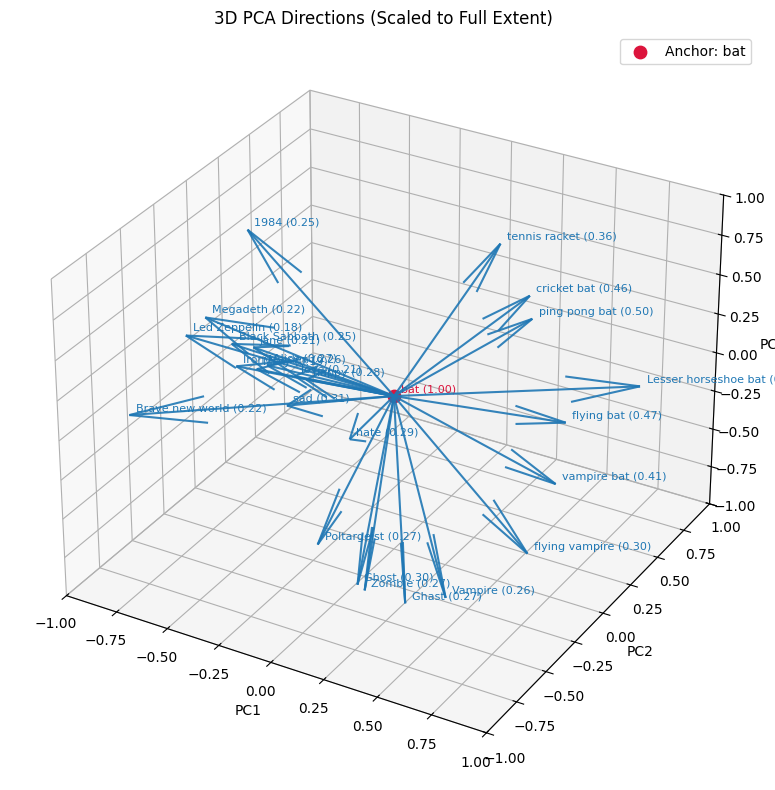

None


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

def plot_cosine_similarity_pca_inverted_3d(response, labels, anchor_idx=0):
    """
    3D PCA plot of embeddings with arrow length inversely related to cosine similarity.
    Arrows are scaled so the furthest point touches the plot edge.
    """
    # --- Collect embeddings and labels ---
    embeddings = np.array([np.array(item.embedding, dtype=float) for item in response.data], dtype=float)
    names = list(labels)
    n = embeddings.shape[0]
    assert len(names) == n, "Length of labels must equal number of embeddings"

    # --- Normalise embeddings ---
    eps = 1e-12
    norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
    embeddings_norm = embeddings / np.clip(norms, eps, None)

    # --- Cosine similarities to anchor ---
    anchor_vec = embeddings_norm[anchor_idx]
    sims = embeddings_norm @ anchor_vec

    # --- Inverted distance mapping ---
    lengths = (1.0 - sims) / 2.0
    lengths = np.clip(lengths, 0.0, 1.0)

    # --- PCA to 3D ---
    reduced = PCA(n_components=3, random_state=0).fit_transform(embeddings_norm)

    # --- Convert to unit directions ---
    magnitudes = np.linalg.norm(reduced, axis=1, keepdims=True)
    zero_dir = magnitudes < eps
    reduced[zero_dir.ravel()] = np.array([1.0, 0.0, 0.0])
    magnitudes = np.linalg.norm(reduced, axis=1, keepdims=True)
    directions = reduced / (magnitudes + eps)

    # --- Scale arrows so max length = 1 ---
    scaled = directions * lengths[:, None]
    max_val = np.max(np.abs(scaled))
    if max_val > 0:
        scaled /= max_val  # normalise to fill cube

    # --- Plot in 3D ---
    fig = plt.figure(figsize=(9, 8))
    ax = fig.add_subplot(111, projection='3d')

    U, V, W = scaled[:, 0], scaled[:, 1], scaled[:, 2]

    # Plot arrows for others
    mask_others = np.ones(n, dtype=bool)
    mask_others[anchor_idx] = False
    ax.quiver(np.zeros(mask_others.sum()), np.zeros(mask_others.sum()), np.zeros(mask_others.sum()),
              U[mask_others], V[mask_others], W[mask_others],
              color='#1f77b4', alpha=0.9, length=1.0, normalize=False)

    # Anchor point
    ax.scatter(0, 0, 0, s=80, color='crimson', label=f"Anchor: {names[anchor_idx]}")

    # Labels near arrow tips
    for i in range(n):
        ax.text(U[i] + 0.02, V[i] + 0.02, W[i] + 0.02,
                f"{names[i]} ({sims[i]:.2f})",
                fontsize=8, color=('crimson' if i == anchor_idx else '#1f77b4'))

    # Styling: full cube [-1, 1]
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('3D PCA Directions (Scaled to Full Extent)')
    ax.legend()
    plt.tight_layout()
    plt.show()

    # Return DataFrame
    df = pd.DataFrame({
        "Index": np.arange(n),
        "Name": names,
        "Cosine Similarity to Anchor": sims,
        "Inverted Distance": lengths
    }).sort_values(by="Inverted Distance", ascending=False, ignore_index=True)

# ---- Usage ----
df = plot_cosine_similarity_pca_inverted_3d(response, inp, anchor_idx=0)
pd.set_option('display.max_rows', None)
print(df)
